# Stellar ejection velocity comparison

Notebook to accompany *Wagg et al. 2025* research note on stellar ejection velocities in population synthesis.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import astropy.units as u
import seaborn as sns
import pandas as pd
import h5py as h5
from scipy.stats import maxwell

In [2]:
%config InlineBackend.figure_format = 'retina'

plt.rc('font', family='serif')
plt.rcParams['text.usetex'] = False
fs = 24

# update various fontsizes to match
params = {'figure.figsize': (12, 8),
          'legend.fontsize': 0.7 * fs,
          'axes.labelsize': fs,
          'xtick.labelsize': 0.7 * fs,
          'ytick.labelsize': 0.7 * fs,
          'axes.linewidth': 1.1,
          'xtick.major.size': 7,
          'xtick.minor.size': 4,
          'ytick.major.size': 7,
          'ytick.minor.size': 4,
          'legend.fontsize': fs,
}
plt.rcParams.update(params)

# show all pandas columns
pd.set_option('display.max_columns', None)

<hr>

# Read data

## `COSMIC`

In [3]:
bpp, cosmic_kicks = pd.read_hdf("data/cosmic.h5", key="bpp"), pd.read_hdf("data/cosmic.h5", key="kick_info")
cosmic_kicks.drop_duplicates(subset="bin_num", keep="first", inplace=True)

In [4]:
sn_1_row = bpp[bpp["evol_type"] == 15].iloc[0]

v_orb = (2 * np.pi * sn_1_row["sep"] * u.Rsun / sn_1_row["porb"] / u.day).to(u.km / u.s)
cosmic_v_orb_2 = sn_1_row["mass_1"] / (sn_1_row["mass_1"] + sn_1_row["mass_2"]) * v_orb
vsys_2_total = cosmic_kicks[cosmic_kicks["star"] == 1]["vsys_2_total"]

## `COMPAS`

In [43]:
df_dict = {}

with h5.File(f"data/compas/COMPAS_Output.h5") as f:
    for k in f["BSE_Supernovae"].keys():
        df_dict[k] = f["BSE_Supernovae"][k][...]
df = pd.DataFrame(df_dict).set_index("SEED", drop=False)
df = df.drop_duplicates(subset="SEED", keep="first")

print(f'Disruption rate: {100 - ((df["Unbound"] == 0).sum() / len(df) * 100)}%')

compas_v_orb_2 = (df["Orb_Velocity<SN"] * (df["Mass_Total@CO(SN)"] / (df["Mass(CP)"] + df["Mass_Total@CO(SN)"]))).iloc[0] * u.km / u.s
print(f"v_orb_2 = {compas_v_orb_2}")

compas_kicks = df.rename(columns={"ComponentSpeed(CP)": "vsys_2_total",
                                 "Applied_Kick_Magnitude(SN)": "natal_kick",
                                 "Unbound": "disrupted",
                                 "SN_Kick_Theta(SN)": "phi",
                                 "SN_Kick_Phi(SN)": "theta"})
compas_kicks["theta"] = compas_kicks["theta"].apply(lambda x: np.degrees(x))
compas_kicks["phi"] = compas_kicks["phi"].apply(lambda x: np.degrees(x))

Disruption rate: 99.104%
v_orb_2 = 14.632644587924512 km / s


## `binary_c`

In [6]:
bc_kicks = pd.read_csv("data/binary_c/output_sn_265_50k.dat", header=0, sep="\s+")
bc_kicks["disrupted"] = (bc_kicks["separation"] < 0.0).astype(int)
bc_kicks.rename(columns={"v_other_tt": "vsys_2_total", "sn_kick_speed": "natal_kick",
                         "sn_kick_omega": "theta", "sn_kick_phi": "phi"}, inplace=True)
bc_kicks["theta"] = bc_kicks["theta"].apply(lambda x: np.degrees(x))
bc_kicks["phi"] = bc_kicks["phi"].apply(lambda x: np.degrees(x))

# bc_kicks = bc_kicks[bc_kicks["vsys_2_total"] > 0.0]

bc_v_orb = (2 * np.pi * bc_kicks["pre_sn_separation"].values * u.Rsun / bc_kicks["pre_sn_period"].values / u.yr).to(u.km / u.s)
bc_v_orb_2 = ((bc_kicks["pre_sn_mass_1"] / (bc_kicks["pre_sn_mass_1"] + bc_kicks["pre_sn_mass_2"])).iloc[0] * bc_v_orb[0])

## All together now!

In [44]:
data = [
    {"kicks": cosmic_kicks, "v_orb_2": cosmic_v_orb_2, "l": "COSMIC", "c": "tab:blue"},
    {"kicks": compas_kicks, "v_orb_2": compas_v_orb_2, "l": "COMPAS", "c": "tab:orange"},
    {"kicks": bc_kicks, "v_orb_2": bc_v_orb_2, "l": "binary_c", "c": "tab:green"}
]

<hr>

# Basic histograms

First, we can separately plot the natal kick distributions (to ensure they are identical) and consider how the ejection velocity distributions compare.

## Natal kick

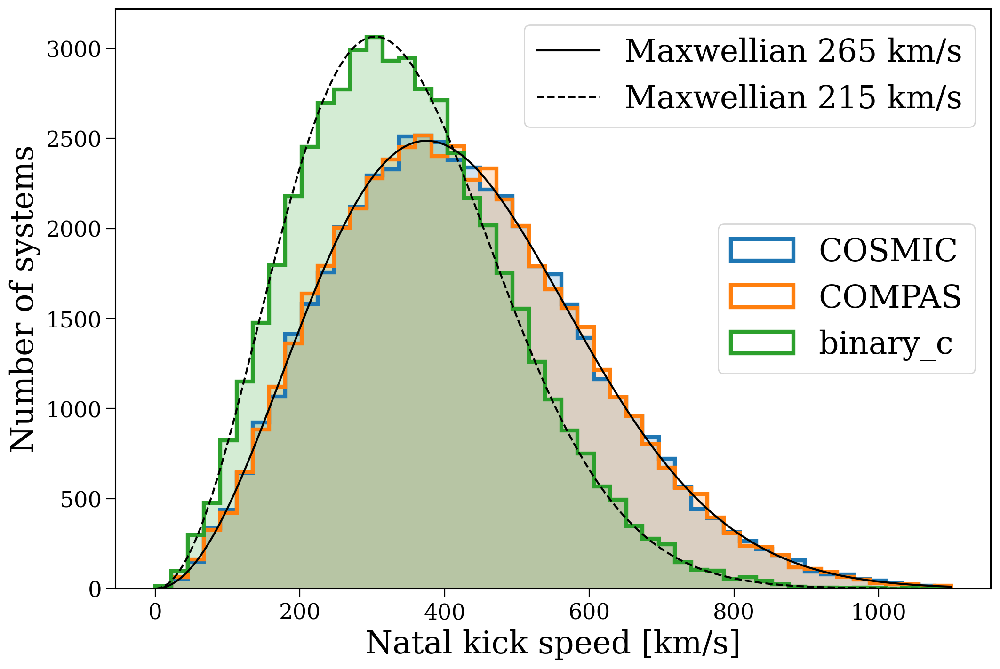

In [8]:
fig, ax = plt.subplots()

bins = np.linspace(0, 1100, 50)
v_range = np.linspace(0, 1100, 1000)

for d in data:
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), histtype="step",
            lw=3, color=d["c"], label=d['l']);
    ax.hist(d["kicks"]["natal_kick"], bins=np.linspace(0, 1100, 50), color=d['c'], alpha=0.2);

leg = ax.legend(loc="center right")

ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=265) * bins[1], color="black", label="Maxwellian 265 km/s")
ax.plot(v_range, len(d["kicks"]) * maxwell.pdf(v_range, scale=215) * bins[1], color="black", linestyle="--", label="Maxwellian 215 km/s")

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[-2:], labels[-2:], loc="upper right")
ax.add_artist(leg)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Number of systems")

plt.show()

## Ejection velocity

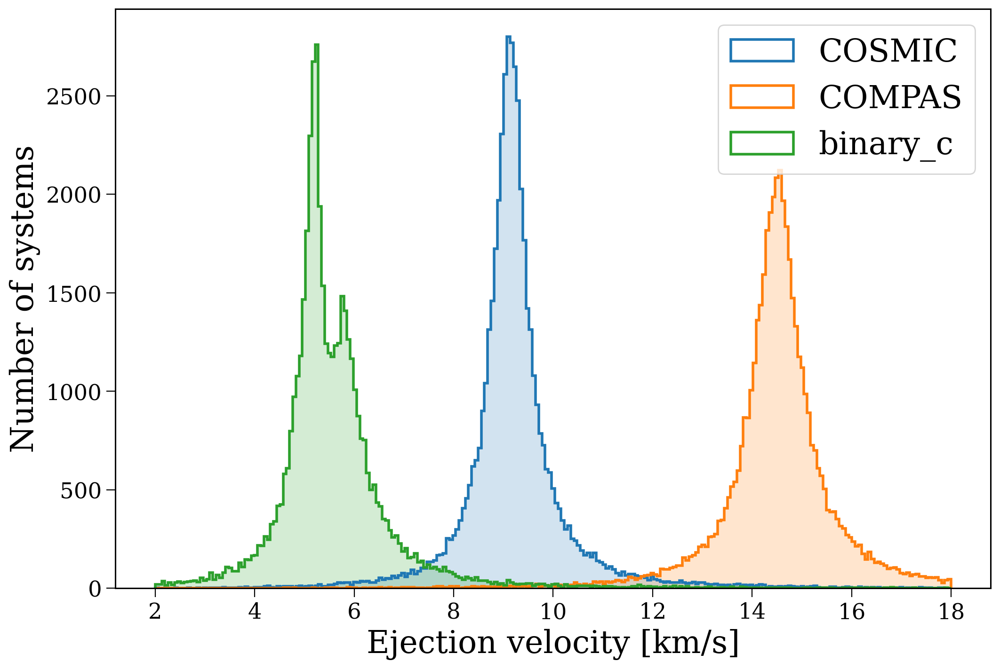

In [79]:
fig, ax = plt.subplots()

bins = np.linspace(2, 18, 250)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    ax.hist(kicks["vsys_2_total"], bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(kicks["vsys_2_total"], bins=bins, color=d['c'], alpha=0.2);

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-5.48052388 -0.12753388  5.04107612]


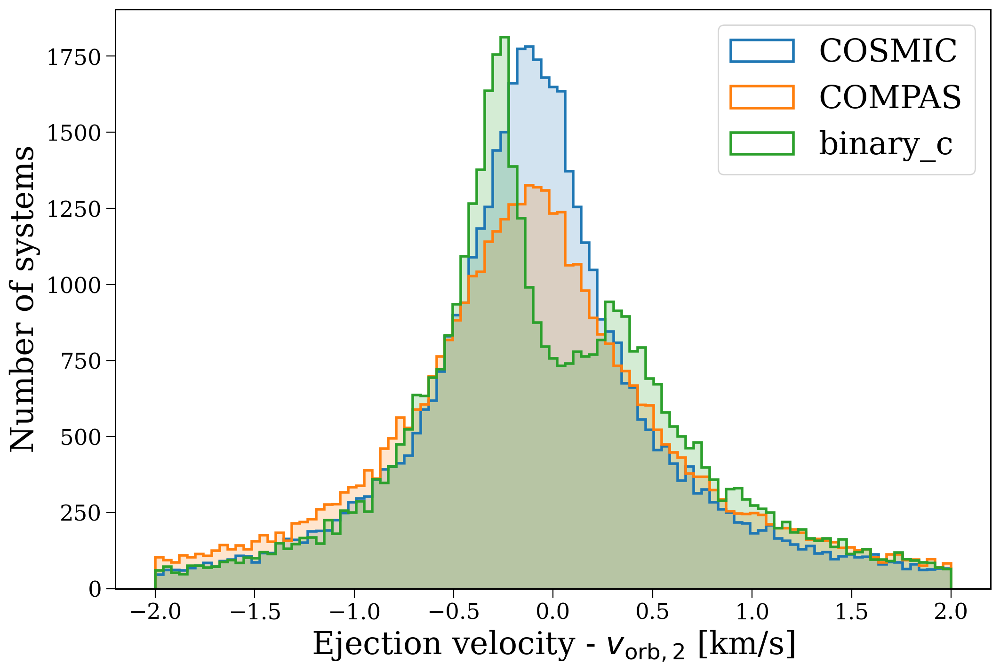

In [80]:
fig, ax = plt.subplots()

bins = np.linspace(-2, 2, 100)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=2, color=d["c"], label=d['l']);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2);

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Ejection velocity - $v_{\\rm orb,2}$ [km/s]",
       ylabel="Number of systems")

plt.show()

[-3.2135503 -0.0877752  4.5707266]
[-4.38369371 -0.09697807  6.38085737]
[-5.48052388 -0.12753388  5.04107612]


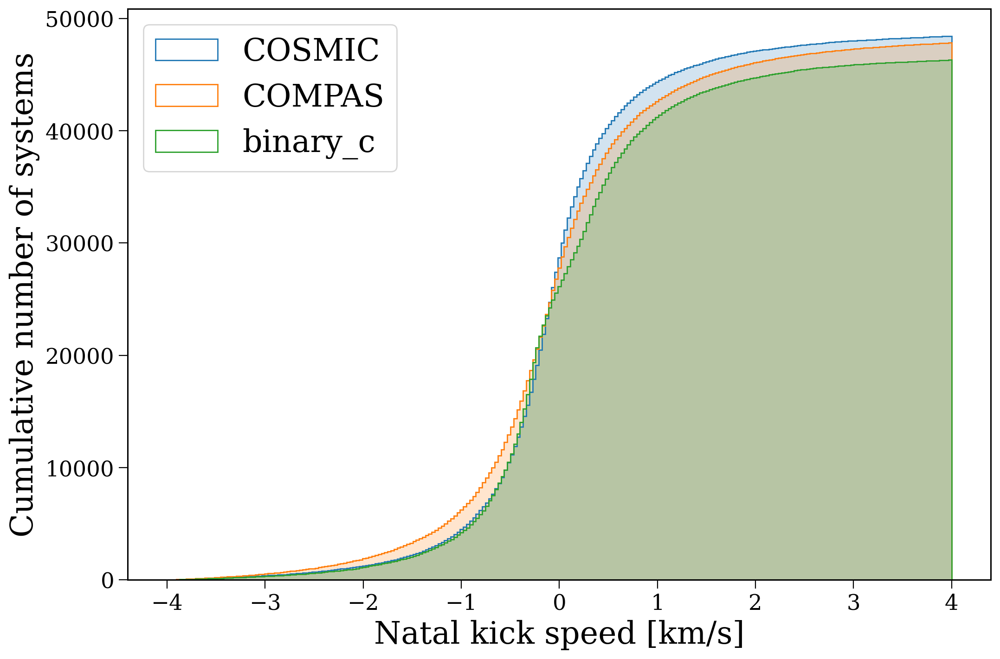

In [47]:
fig, ax = plt.subplots()

bins = np.linspace(-4, 4, 250)
for d in data:
    kicks = d["kicks"][d["kicks"]["disrupted"] == 1]
    diff = kicks["vsys_2_total"] - d["v_orb_2"]
    ax.hist(diff, bins=bins, histtype="step",
            lw=1, color=d["c"], label=d['l'], cumulative=True);
    ax.hist(diff, bins=bins, color=d['c'], alpha=0.2, cumulative=True);

    print(np.percentile(diff, [1, 50, 99]))

ax.legend(ncol=1)

ax.set(xlabel="Natal kick speed [km/s]", ylabel="Cumulative number of systems")

plt.show()

# 2D density distributions

In [74]:
def plot_kick_density(natal_kicks, v_orb_2, label="COSMIC", every=1, lim=4.5, CORNER_ANNOTATE=False, save=None):
    """Plot 2D density distribution for each different population synthesis code"""

    fig, axes = plt.subplots(2, 2, figsize=(12, 12), gridspec_kw={"width_ratios": [4, 1], "height_ratios": [1, 4]}, sharex="col", sharey="row")
    fig.subplots_adjust(hspace=0.03, wspace=0.03)

    # difference between ejection velocities and preSN orbital velocity
    mask = (natal_kicks["disrupted"] == 1) & (natal_kicks["vsys_2_total"] > 0.0)
    diff = natal_kicks["vsys_2_total"][mask] - v_orb_2

    # add difference histogram within chosen limits (and remove white lines with patches)
    patches = axes[0, 0].hist(diff[abs(diff) < lim], bins=np.linspace(-lim, lim, 220))[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    # same for the natal kick magnitude
    patches = axes[1, 1].hist(natal_kicks["natal_kick"][mask][abs(diff) < lim],
                              bins=np.linspace(0, 1100, 50),
                              orientation="horizontal")[-1]
    for patch in patches:
        patch.set_edgecolor(patch.get_facecolor())

    # add main density plot
    sns.kdeplot(x=diff[abs(diff) < lim * 1.5][::every],
                y=natal_kicks["natal_kick"][mask][abs(diff) < lim * 1.5][::every],
                ax=axes[1, 0], color="tab:blue", fill=True, levels=np.linspace(0.05, 1, 6))

    axes[1, 0].set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
                   ylabel="Natal kick velocity (km/s)",
                   xlim=(-lim, lim),
                   ylim=(0, 1100))

    # annotate system details in corner or on main panel
    if CORNER_ANNOTATE:
        axes[0, 1].annotate(label, (0.5, 0.8), xycoords="axes fraction", color="black", fontsize=fs, ha="center", va="center")
        axes[0, 1].annotate(
            r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.1f} km/s\n' +
            r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks):1.3f}\n' +
            r"$m_{\rm 1, preSN} = $" + f'{sn_1_row["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{bpp.iloc[-1]["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 2} = $" + f'{sn_1_row["mass_2"]:1.2f} $\\rm M_{{\odot}}$',
            (0.5, 0.35), xycoords="axes fraction", fontsize=0.6*fs, ha="center", va="center"
        )
    else:
        axes[1, 0].annotate(label, (0.05, 0.95), xycoords="axes fraction", color="black",
                            fontsize=1.3*fs, fontweight="normal", ha="left", va="top")
        axes[1, 0].annotate(
            " " * 2 + r"$v_{\rm 2, preSN} = $" + f'{v_orb_2.value:1.2f} km/s\n' +
            " " * 4 + r"$f_{\rm disrupt} = $" + f'{natal_kicks["disrupted"].sum() / len(natal_kicks):1.3f}\n' +
            " " * 1 + r"$m_{\rm 1, preSN} = $" + f'{sn_1_row["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            r"$m_{\rm 1, postSN} = $" + f'{bpp.iloc[-1]["mass_1"]:1.2f} $\\rm M_{{\odot}}$\n' +
            " " * 9 + r"$m_{\rm 2} = $" + f'{sn_1_row["mass_2"]:1.2f} $\\rm M_{{\odot}}$',
            (0.64, 0.98), xycoords="axes fraction", fontsize=0.7*fs, ha="left", va="top"
        )

    # add a line at zero and hide the mini ax
    axes[1, 0].axvline(0, color="black", linestyle="dotted", lw=1)
    axes[0, 1].axis("off")

    if save is not None:
        plt.savefig(f"plots/{save}.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()

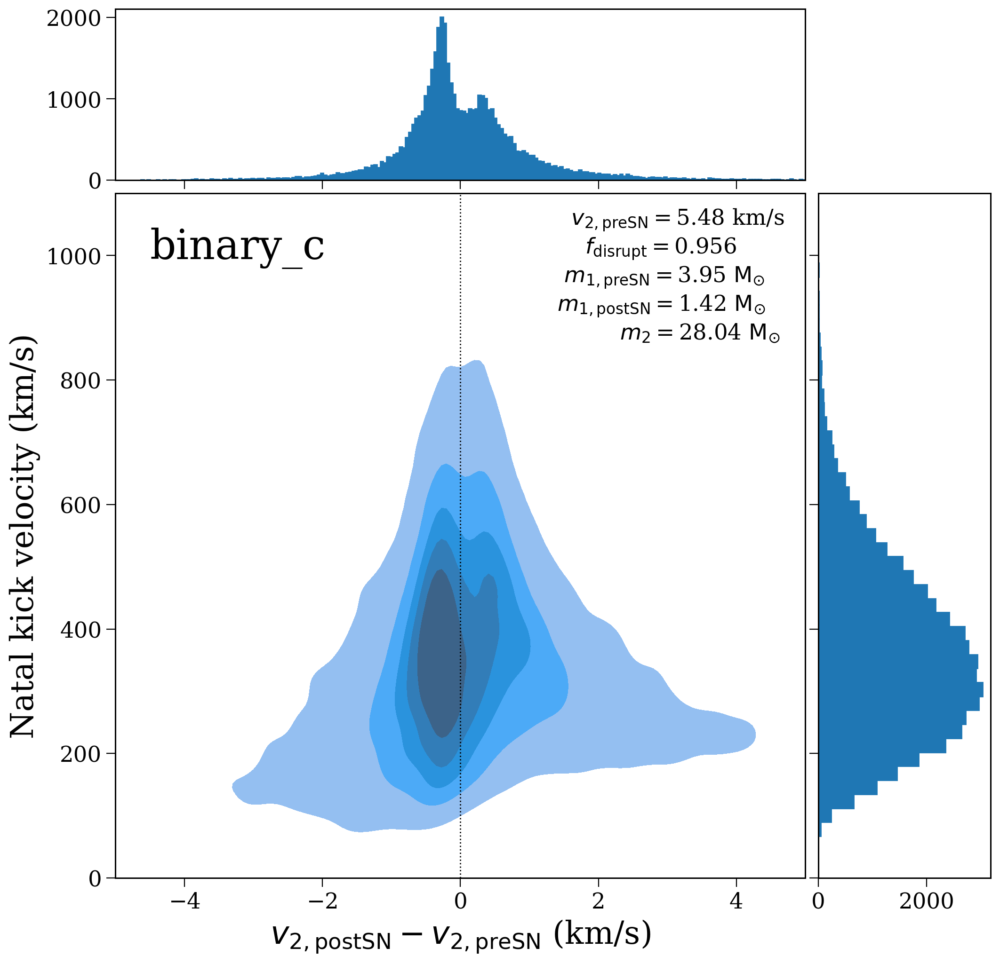

CPU times: user 26.2 s, sys: 45.9 ms, total: 26.2 s
Wall time: 25.7 s


In [81]:
%%time
for d in [data[-1]]:
    plot_kick_density(natal_kicks=d["kicks"], v_orb_2=d["v_orb_2"], label=d["l"], save=d["l"].lower(), every=1)

# `binary_c` has correlated kicks and angles?

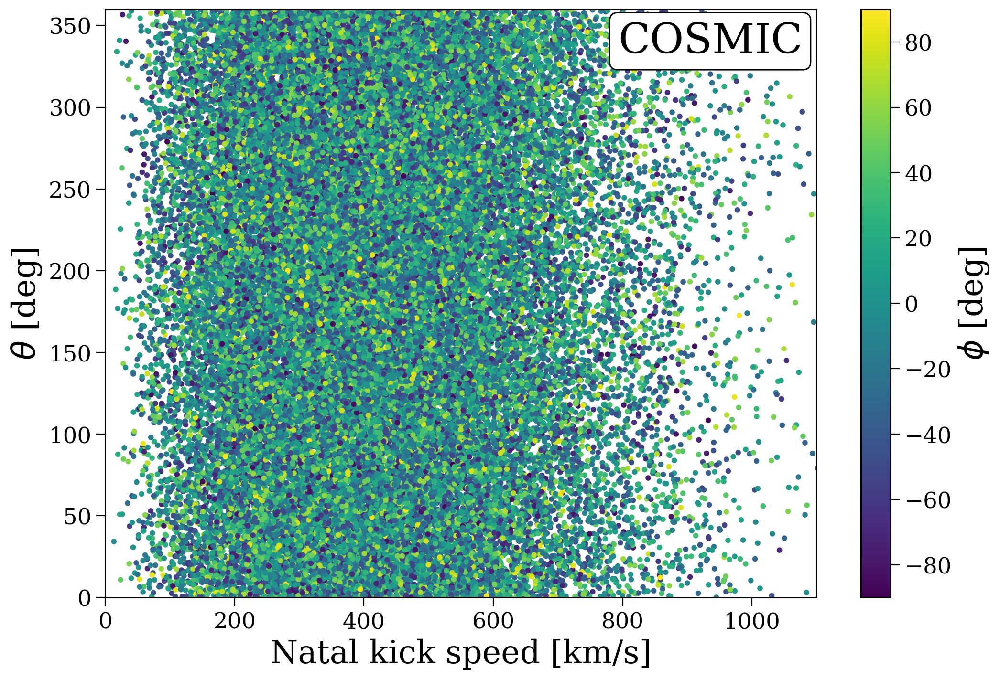

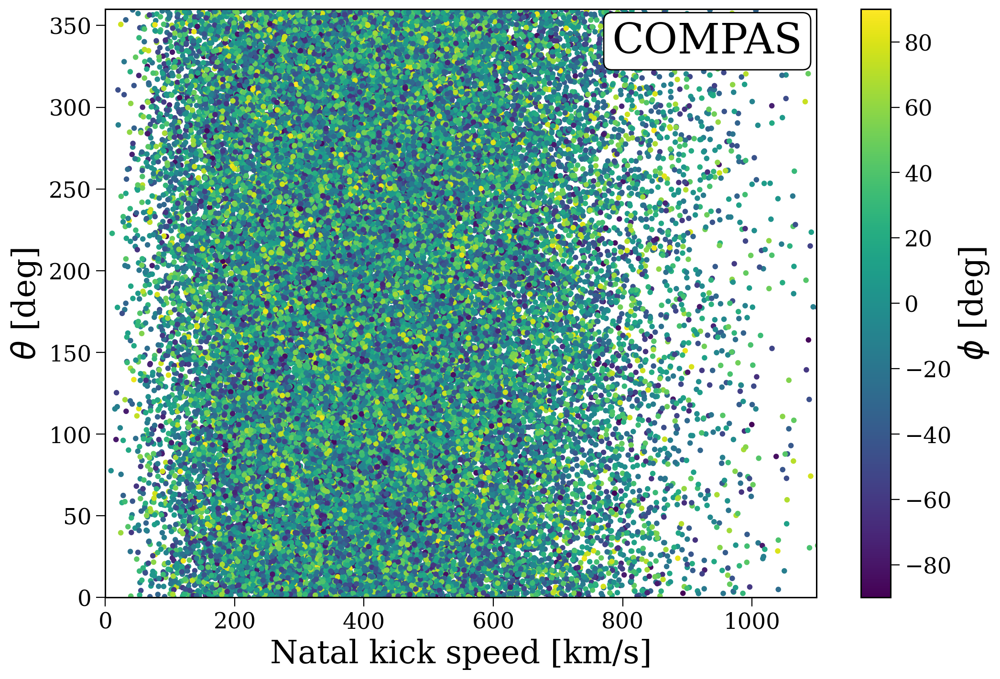

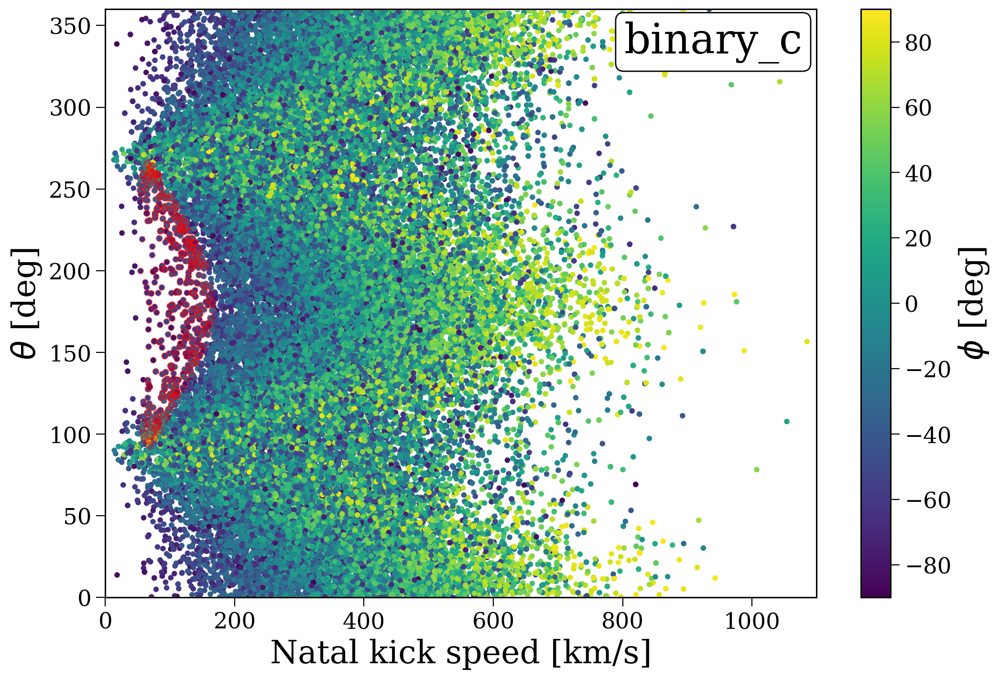

In [49]:
for d in data:
    scatter = plt.scatter(d["kicks"]["natal_kick"], d["kicks"]["theta"], s=10, c=d["kicks"]["phi"], vmin=-90, vmax=90, cmap="viridis")

    mask = (d["kicks"]["vsys_2_total"] == 0) & (d["kicks"]["disrupted"] == 1)
    plt.scatter(d["kicks"]["natal_kick"][mask], d["kicks"]["theta"][mask], s=20, marker="o",
                facecolor="none", edgecolor="red", lw=0.5, alpha=0.5)
    cbar = plt.colorbar(scatter, label=r"$\phi$ [deg]")
    plt.xlabel("Natal kick speed [km/s]")
    plt.ylabel(r"$\theta$ [deg]")
    plt.xlim(0, 1100)
    plt.ylim(0, 360)
    plt.annotate(d["l"], (0.98, 0.98), xycoords="axes fraction", color="black",
                 fontsize=1.3*fs, fontweight="normal", ha="right", va="top",
                 bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.2"))
    plt.show()

# Angle dependence

In [51]:
def plot_ejection_kick_with_angle(d):

    fig, ax = plt.subplots()

    natal_kicks = d["kicks"]
    scatter = plt.scatter(natal_kicks["vsys_2_total"][natal_kicks["disrupted"] == 1] - d["v_orb_2"],
                      natal_kicks["natal_kick"][natal_kicks["disrupted"] == 1],
                      c=natal_kicks["theta"][natal_kicks["disrupted"] == 1] / 360 * 2 * np.pi,
                      s=1, cmap="twilight")
    cbar = plt.colorbar(scatter)
    cbar.set_label(r"Azimuthal angle of kick, $\omega \, [\rm rad]$")
    cbar.ax.set_yticks([0, np.pi / 2, np.pi, 3 * np.pi / 2, 2 * np.pi])
    cbar.ax.set_yticklabels(["0", r"$\pi/2$", r"$\pi$", r"$3\pi/2$", r"$2\pi$"])

    ax.set(xlabel=r"$v_{\rm 2, postSN} - v_{\rm 2, preSN}$ (km/s)",
           ylabel="Natal kick velocity (km/s)",
           xlim=(-4, 4),
           ylim=(0, 1100))
    
    ax.annotate(d["l"], (0.05, 0.95), xycoords="axes fraction", color="black",
                fontsize=1.3*fs, fontweight="normal", ha="left", va="top")

    plt.show()

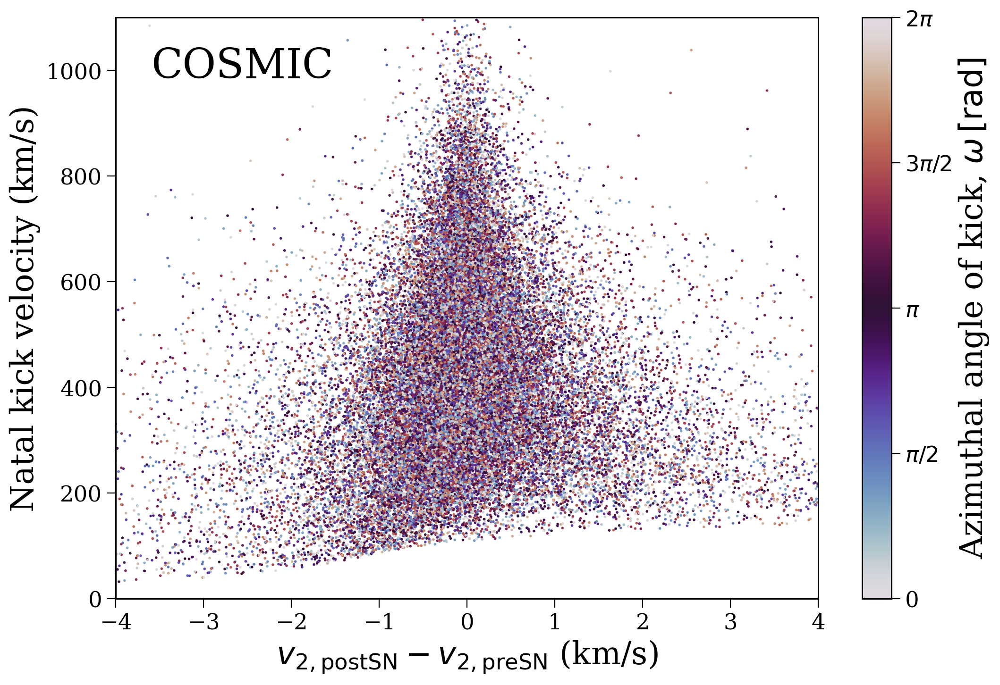

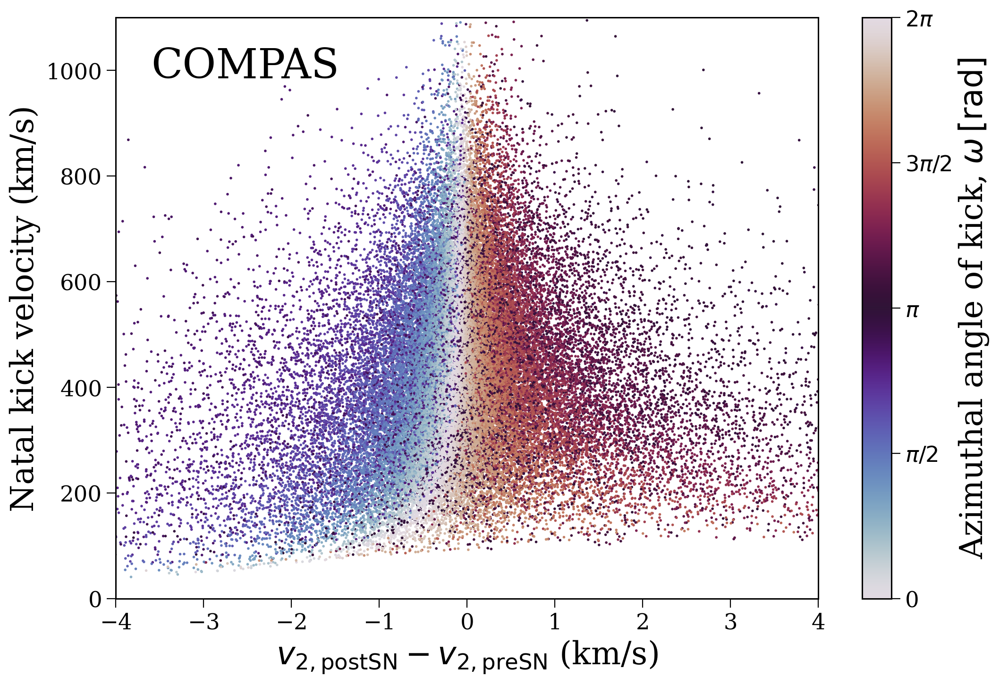

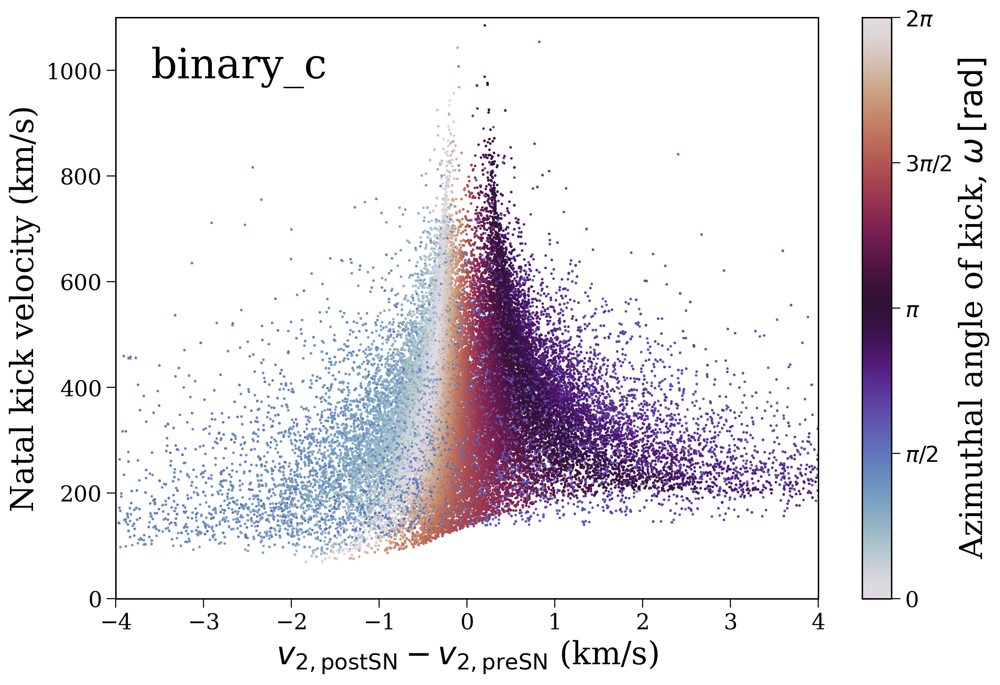

In [52]:
for d in data:
    plot_ejection_kick_with_angle(d)

<hr>

# OLD

In [58]:
single_binary = InitialBinaryTable.InitialBinaries(m1=20, m2=15, porb=100, ecc=0.0, tphysf=13700.0,
                                                   kstar1=1, kstar2=1, metallicity=0.02)

N = 500
ibt = single_binary.loc[single_binary.index.repeat(N)].reset_index()
BSEDict = {'xi': 1.0, 'bhflag': 1, 'neta': 0.5, 'windflag': 3, 'wdflag': 1, 'alpha1': 1.0, 'pts1': 0.001, 'pts3': 0.02, 'pts2': 0.01, 'epsnov': 0.001, 'hewind': 0.5, 'ck': 1000, 'bwind': 0.0, 'lambdaf': 0.0, 'mxns': 3.0, 'beta': -1.0, 'tflag': 1, 'acc2': 1.5, 'grflag': 1, 'remnantflag': 4, 'ceflag': 0, 'eddfac': 1.0, 'ifflag': 0, 'bconst': 3000, 'sigma': 265, 'gamma': -2.0, 'pisn': 45.0, 'natal_kick_array': [[-100.0, -100.0, -100.0, -100.0, 0.0], [-100.0, -100.0, -100.0, -100.0, 0.0]], 'bhsigmafrac': 1.0, 'polar_kick_angle': 90, 'qcrit_array': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], 'cekickflag': 2, 'cehestarflag': 0, 'cemergeflag': 0, 'ecsn': 2.25, 'ecsn_mlow': 1.6, 'aic': 1, 'ussn': 0, 'sigmadiv': -20.0, 'qcflag': 5, 'eddlimflag': 0, 'fprimc_array': [0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523, 0.09523809523809523], 'bhspinflag': 0, 'bhspinmag': 0.0, 'rejuv_fac': 1.0, 'rejuvflag': 0, 'htpmb': 1, 'ST_cr': 1, 'ST_tide': 1, 'bdecayfac': 1, 'rembar_massloss': 0.5, 'kickflag': 1, 'zsun': 0.014, 'bhms_coll_flag': 0, 'don_lim': -1, 'acc_lim': -1, 'binfrac': 0.5, 'rtmsflag': 0, 'wd_mass_lim': 1}
bpp, bcm, ibt, kick_info = Evolve.evolve(initialbinarytable=ibt, BSEDict=BSEDict, nproc=6)